In [53]:
#pip install photutils
#pip install astroquery

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from scipy.spatial.distance import cdist
import cv2
import sys
import pandas as pd
from IPython.display import display
from datetime import datetime

from astroquery.simbad import Simbad
from astroquery.vizier import Vizier
from photutils.aperture import ApertureStats, aperture_photometry, CircularAperture, CircularAnnulus
from photutils.detection import DAOStarFinder, find_peaks
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from astropy.table import vstack, Table, Column
from astropy.wcs import WCS
import astropy.units as u
from astropy.coordinates import SkyCoord

sys.path.append('/home/finn/visual_Studio_Code/bachelorarbeit/')
from phot_used_functions import filter_sources, determine_distance, determine_shift, determine_magnitudes, determine_fwhm
from phot_used_functions import import_images
from plotting import show_image

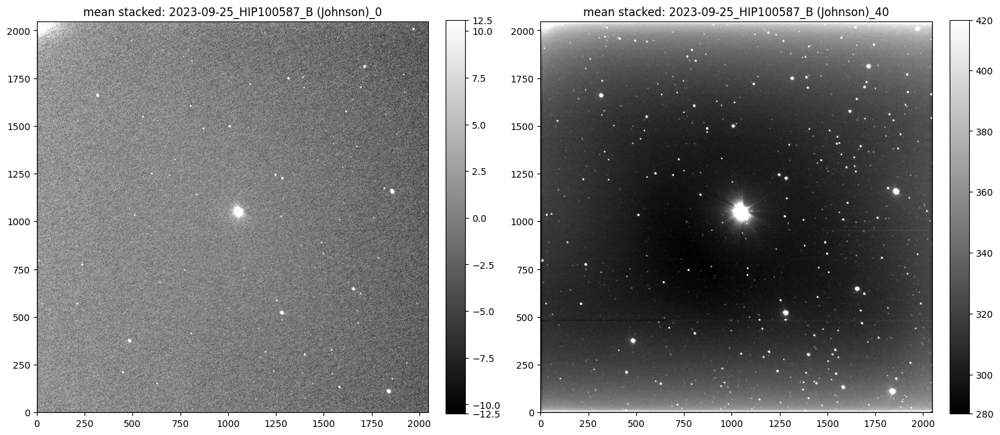

In [3]:
## from phot_used_functions import import_images
path_short        ='/home/finn/visual_Studio_Code/data/2023-09-25/stacked/lightCor_HIP100587_B (Johnson)_0.7s_10_images_stacked_'
path_long         ='/home/finn/visual_Studio_Code/data/2023-09-25/stacked/lightCor_HIP100587_B (Johnson)_40.0s_10_images_stacked_'
path_short_median ='/home/finn/visual_Studio_Code/data/2023-09-25/stacked_old/lightCor_HIP100587_B (Johnson)_0.7s_long-short-series_10_images_stacked_'
path_long_median  ='/home/finn/visual_Studio_Code/data/2023-09-25/stacked_old/lightCor_HIP100587_B (Johnson)_40.0s_long-short-series_10_images_stacked_'

image_list_long,  header_list_long, titles_long, exptime_long = import_images(path_long)
image_list_short, header_list_short, titles_short, exptime_short = import_images(path_short)
image_list_long_median, header_list_long_median, titles_long_median, exptime_long_median = import_images(path_long_median)
image_list_short_median, header_list_short_median, titles_short_median, exptime_short_median = import_images(path_short_median)

middle = len(image_list_short)//2
image_short = image_list_short_median[middle]
image_long = image_list_long_median[middle]

w_short = WCS(header_list_short[middle]) #use mean images wcs because i didnt solved for median yet
w_long = WCS(header_list_long[middle])


fig, ax = plt.subplots(1, 2, figsize=(15, 30))
show_image(image_short, fig=fig, ax=ax[0])
show_image(image_long , fig=fig, ax=ax[1])
ax[0].set_title(f'mean stacked: {titles_short[middle]}')
ax[1].set_title(f'mean stacked: {titles_long[middle]}')
plt.tight_layout()

In [56]:
time_list =[]
for i in range (len(header_list_long)):
    print(header_list_long[i]['DATE-OBS'])
    time_list.append(header_list_long[i]['DATE-OBS'])

output_path = path_short[:46] + 'results'
if not os.path.exists(output_path):
    os.makedirs(output_path)

file_name = 'time_list' + '.txt'
file_path = os.path.join(output_path, file_name) 
with open(file_path, 'w') as file:
    for item in time_list:
        file.write(f"{item}\n")

2023-09-05T19:30:06
2023-09-05T19:39:22
2023-09-05T19:48:37
2023-09-05T19:57:52
2023-09-05T20:07:09


[-16.436483244356115, -16.44068576416676, -16.469007502814407, -16.4368024548831, -16.422889703162266]
0.015168199358291902
[array([[1031.14048241, 1029.99571472]]), array([[1027.57278343, 1037.3744952 ]]), array([[1024.75325096, 1035.57312677]]), array([[1023.26013094, 1038.96108462]]), array([[1017.33506499, 1040.96722091]])]
[-16.4675502846698, -16.461717001526864, -16.475480367109085, -16.453075707163297, -16.431962506342263]
0.014918296398765976
[array([[1031.1412769 , 1030.00044707]]), array([[1027.57728075, 1037.36996719]]), array([[1024.76555551, 1035.5725116 ]]), array([[1023.22862399, 1038.94593994]]), array([[1017.31957627, 1040.96184592]])]


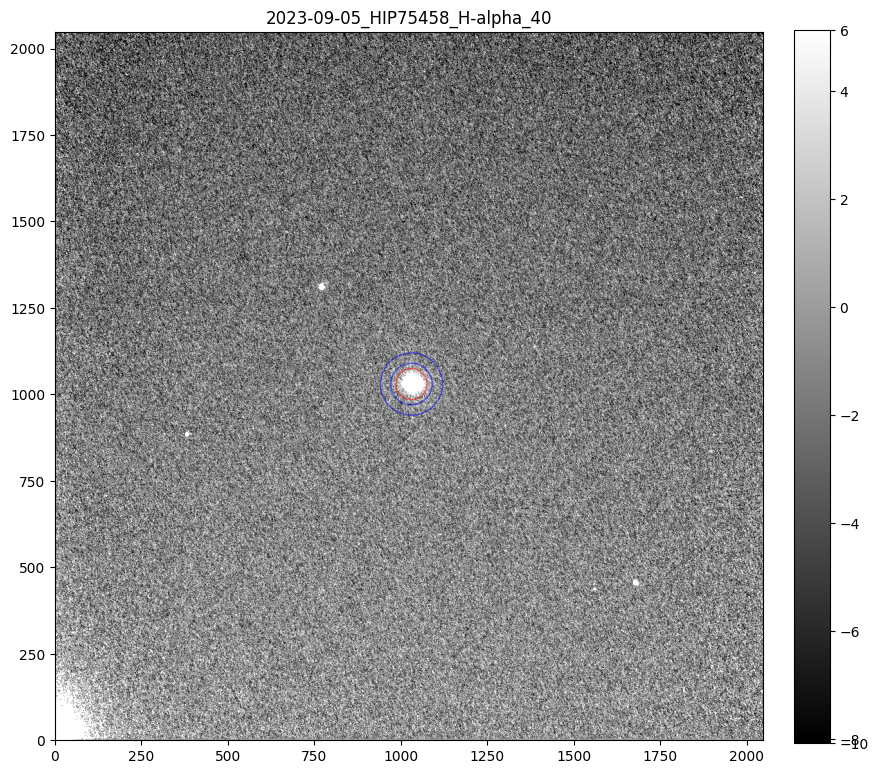

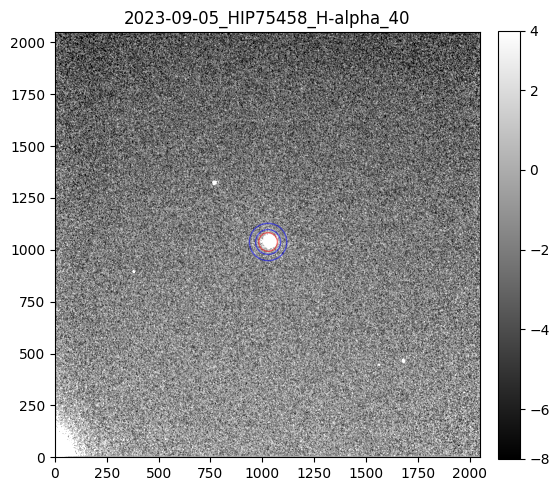

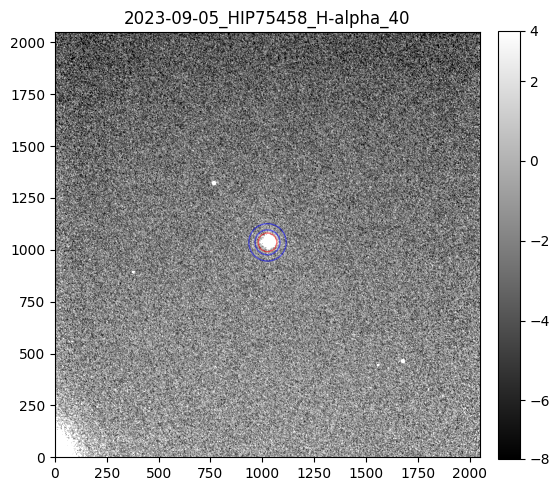

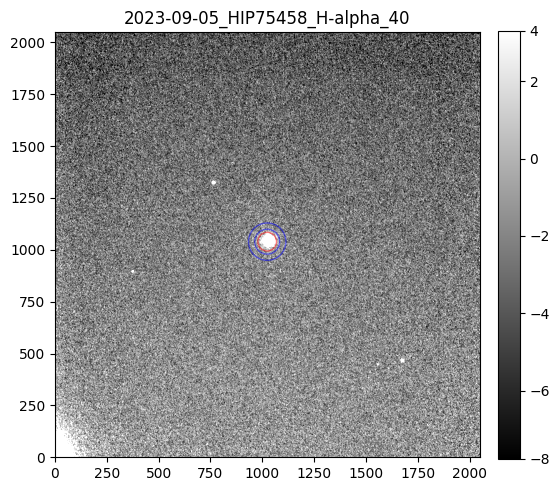

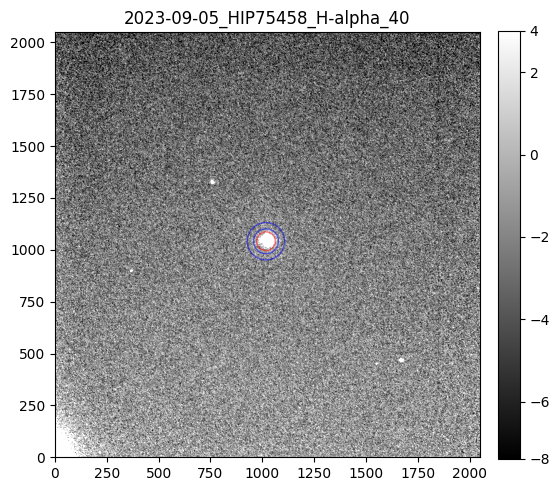

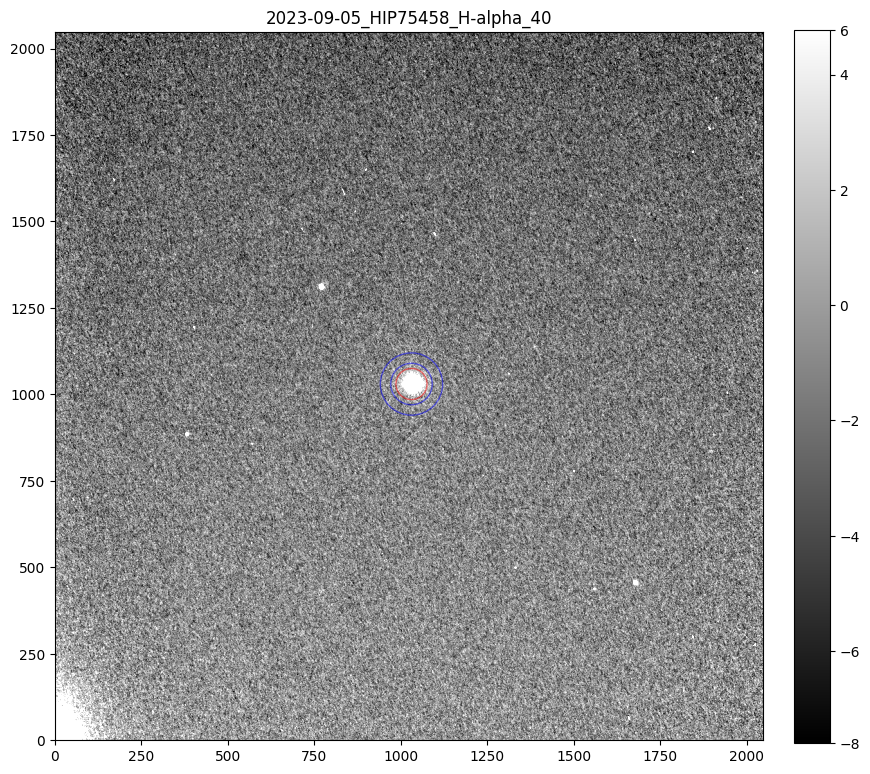

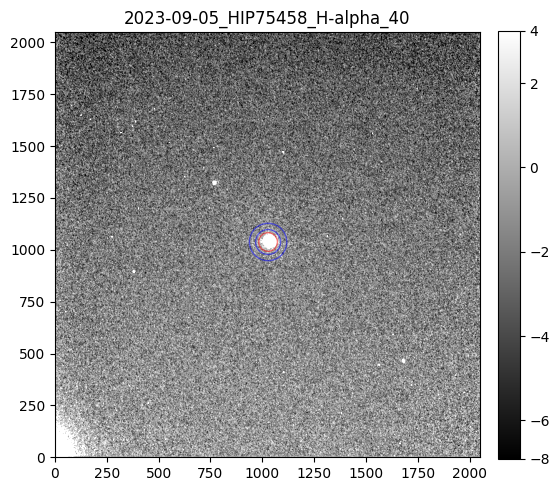

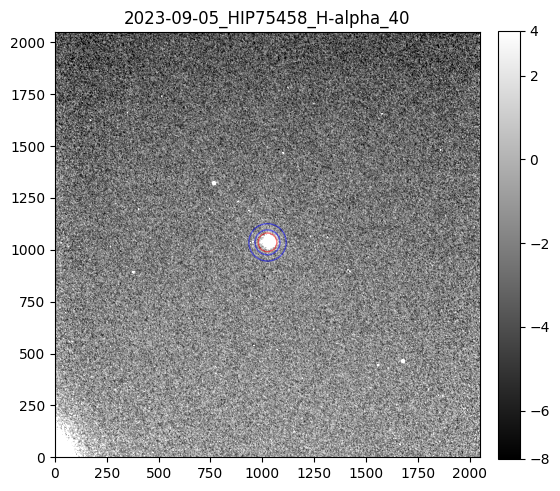

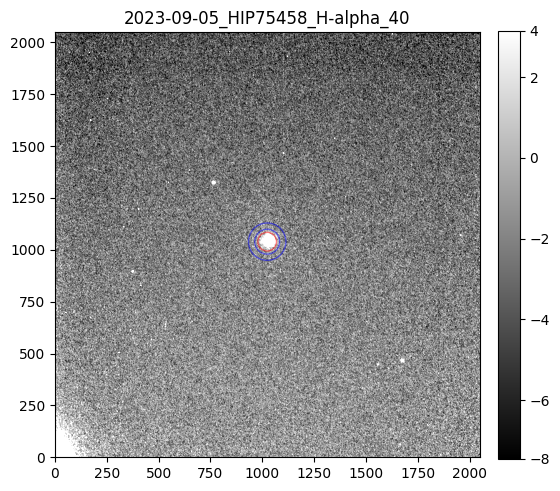

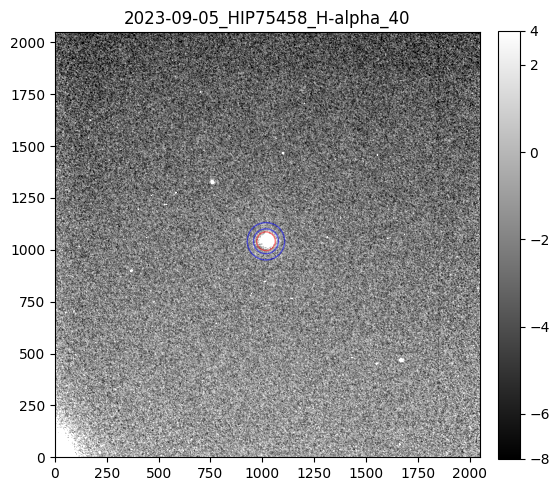

In [57]:
radius_bright = 45 ############## change here 
def get_mag_bright(image_list, apperture_radius=60): #default value of the apperture radius is 60 but need to be changed below
    positions_bright, magnitude_list_bright = [], []

    for i, image in enumerate(image_list):
        mean, median, std = sigma_clipped_stats(image, sigma=3.0)
        daofind = DAOStarFinder(fwhm=5.0, threshold=5.0*std, roundlo=-5.0, roundhi=5.0,brightest=1) #roundlo and roundhi to adjust detection shape. need to be
        sources = daofind(image)
        positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
        if i == 0:
            fig, ax = plt.subplots(1,1, figsize=(10,10))
        else: 
            fig, ax = plt.subplots(1,1, figsize=(6,6))
        show_image(image, fig=fig, ax=ax)
        ax.set_title(titles_long[i])
        magnitudes = determine_magnitudes(image, positions=positions, star_radius=apperture_radius, exptime=exptime_short)
        magnitude_list_bright.append(magnitudes)
        positions_bright.append(positions)
    print(magnitude_list_bright)
    print(np.std(magnitude_list_bright))
    print(positions_bright)
    return positions_bright, magnitude_list_bright

pos_br_median, mag_br_median = get_mag_bright(image_list_short_median, apperture_radius=radius_bright)
pos_br_mean, mag_br_mean = get_mag_bright(image_list_short, apperture_radius=radius_bright)

In [58]:
#should be the same theoretically 
print(pos_br_mean)
print(pos_br_median)

[array([[1031.1412769 , 1030.00044707]]), array([[1027.57728075, 1037.36996719]]), array([[1024.76555551, 1035.5725116 ]]), array([[1023.22862399, 1038.94593994]]), array([[1017.31957627, 1040.96184592]])]
[array([[1031.14048241, 1029.99571472]]), array([[1027.57278343, 1037.3744952 ]]), array([[1024.75325096, 1035.57312677]]), array([[1023.26013094, 1038.96108462]]), array([[1017.33506499, 1040.96722091]])]


In [59]:
# determine the shifts between images (other version at bottom of document)
shifts_long = determine_shift(image_list_long_median)
print(shifts_long)

#should be comperable
#shifts_short = determine_shift(image_list_short_median)
#print(shifts_short)

Number of images to process: 5
we use image:  2 from given list as reference image


[(5.1540694, -7.0924296), (2.778135, -1.0078695), (0, 0), (-3.2059774, 1.9374256), (-7.2466826, 5.1298766)]


27
27
27
27
27
[-6.0187624735768495, -6.013313808379494, -6.005814875245084, -5.9901251118975365, -5.955490924696213]
0.02274761240454101
27
27
27
27
27
[-6.00697877309601, -6.013484048887045, -5.997640683303844, -5.991634369409091, -5.951107165252365]
0.021863028651586493


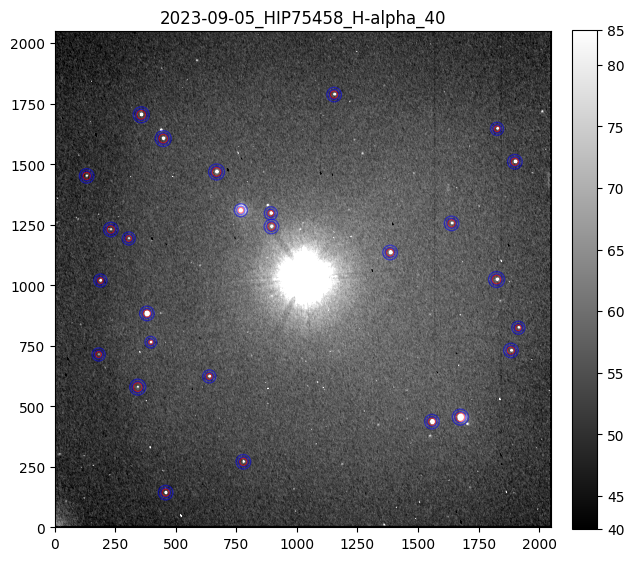

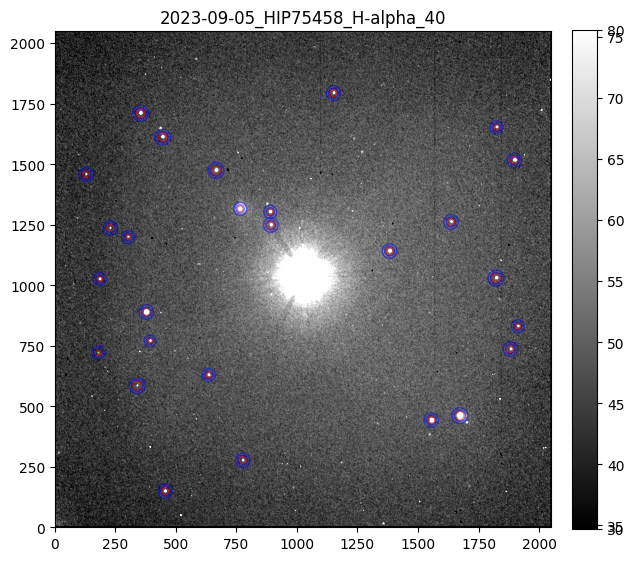

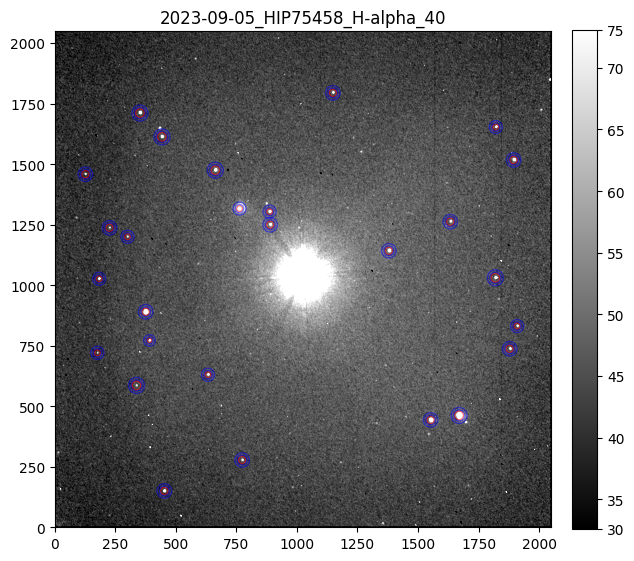

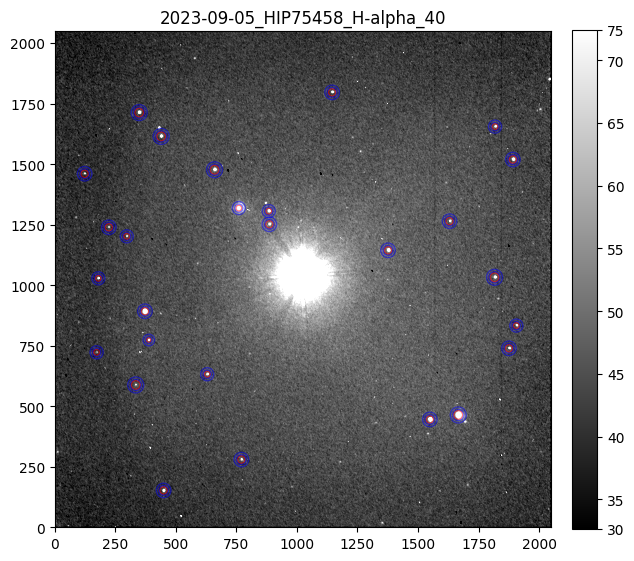

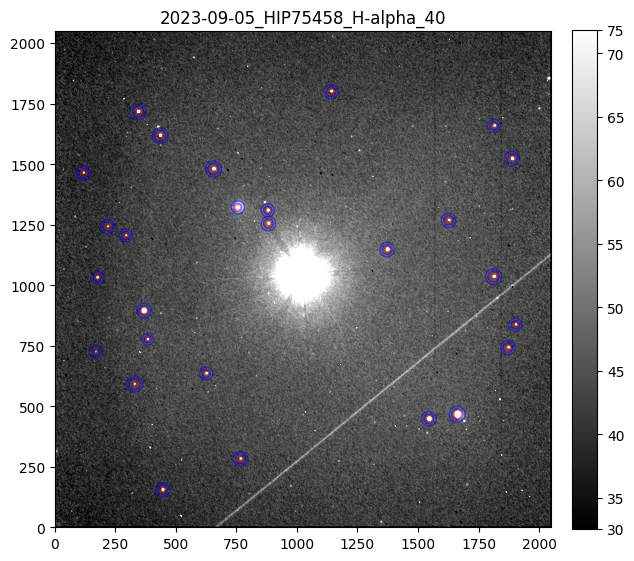

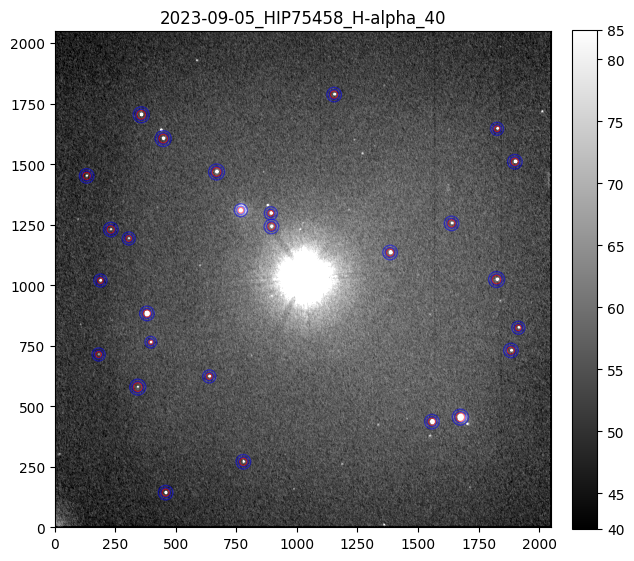

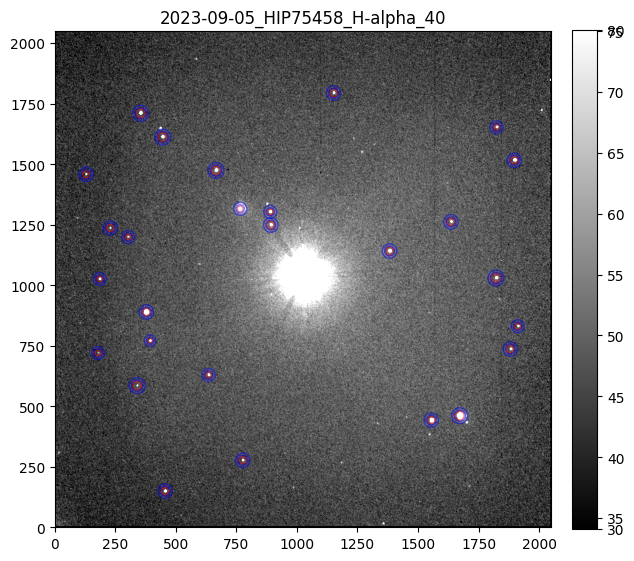

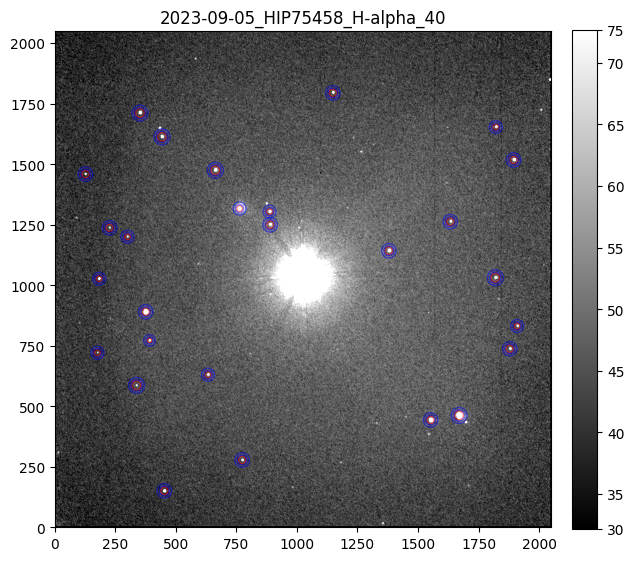

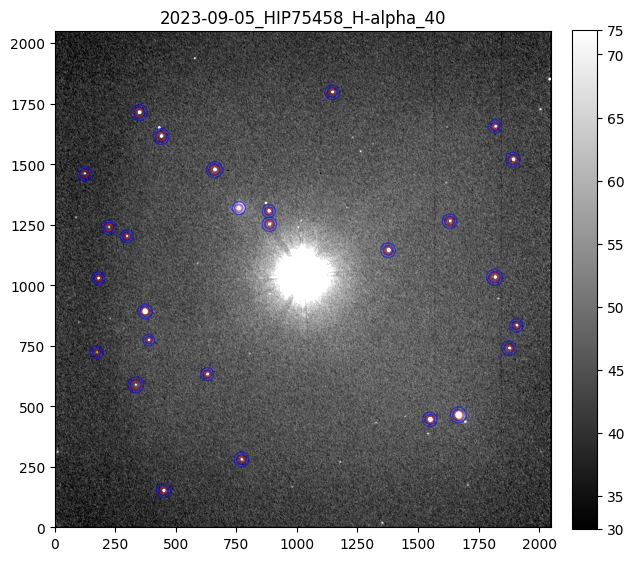

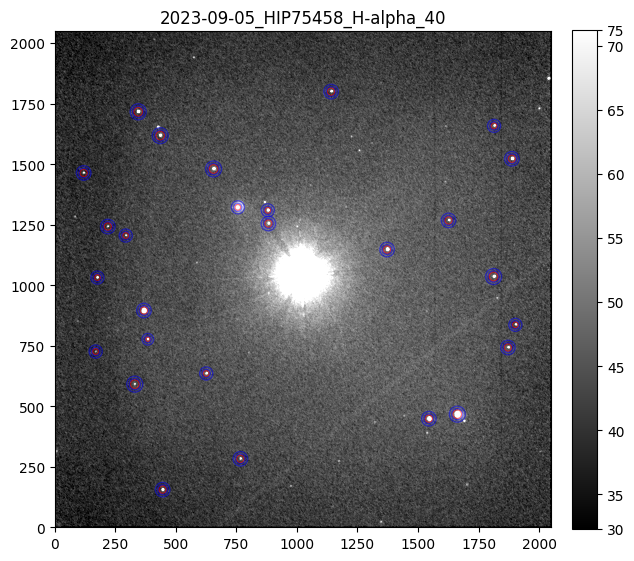

In [60]:
def get_mag_faint(image_list, threshold_value = 3):
    magnitude_list_faint, positions_faint = [], []

    mask = np.zeros(image_long.shape, dtype=bool)
    x, y = np.ogrid[:image_long.shape[1], :image_long.shape[0]]
    circle_mask = np.sqrt((x - pos_br_median[middle][0][1]) ** 2 + (y - pos_br_median[middle][0][0]) ** 2) <= (radius_bright+100)
    mask[circle_mask] = True

    mean, median, std = sigma_clipped_stats(image_long, sigma=3.0)
    daofind = DAOStarFinder(fwhm=3.0, threshold=threshold_value*std, roundlo=-5.0, roundhi=5.0) #roundlo and roundhi to adjust detection shape. need to be calibrated
    sources = daofind(image_long, mask=mask) #use image_long =middle image form median stacked
    sources.sort(['xcentroid', 'ycentroid'])
    positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
    # Exclude multiple detections and stars which are to close to edge or each other (keep the brightest star)
    positions,sources = filter_sources(positions, sources, min_edge_distance=60)
    #determine individual radii for apertures
    valid_positions, fwhm = determine_fwhm(image_long, positions,max_value=8) ######################change max value later
    radii = [value * 3 for value in fwhm]  # aperture size should be 3 * FWHM
    
    for i,image in enumerate (image_list):
        shifted_positions = []
        for position in valid_positions:
            tuple = np.array((position[0]+shifts_long[i][0], position[1]+shifts_long[i][1]))
            #tuple = np.array((position[0]+shifts_alternative[i][0][0], position[1]+shifts_alternative[i][0][1]))
            shifted_positions.append(tuple)
        print(len(shifted_positions))

        fig, ax = plt.subplots(1,1, figsize = (7,7))
        show_image(image, fig=fig, ax=ax)
        ax.set_title(titles_long[i])
        apertures_faint = [CircularAperture(position, r=r) for position, r in zip(shifted_positions, radii)]
        annulus_apertures_faint = [CircularAnnulus(position,r_in=radius+5, r_out=radius+15) for position,radius in zip(shifted_positions,radii)]
        for aperture in apertures_faint:
            aperture.plot(color="red", lw=1.0, alpha=0.5)
        for anulus in annulus_apertures_faint:
            anulus.plot(color="blue", lw=1.0, alpha=0.5)

        # Initialize an empty table to store the photometry results
        phot_table_faint = Table(names=('id', 'xcenter', 'ycenter', 'aperture_sum', 'total_bkg'), dtype=('int', 'float', 'float', 'float', 'float'))
        for j in range(len(apertures_faint)):
            aperstats = ApertureStats(image, annulus_apertures_faint[j])
            bkg = aperstats.median
            aperture_area = apertures_faint[j].area_overlap(image)
            total_bkg = bkg * aperture_area
            phot_table = aperture_photometry(image, apertures_faint[j])
            phot_table['total_bkg'] = total_bkg
            phot_table_faint.add_row([j, phot_table['xcenter'][0], phot_table['ycenter'][0], phot_table['aperture_sum'][0], phot_table['total_bkg'][0]])
        magnitudes=[]
        for row in phot_table_faint:
            magnitude =  - (2.5 * np.log10(abs(row['aperture_sum'] - row['total_bkg']) / exptime_long))
            magnitudes.append(magnitude)
        magnitude_list_faint.append(magnitudes)
        positions_faint.append(shifted_positions)


    mean_faint_magnitudes_list = [np.mean(mag) for mag in magnitude_list_faint] #mean of all refernce stars
    print(mean_faint_magnitudes_list)
    print(np.std(mean_faint_magnitudes_list))
    return positions_faint, magnitude_list_faint, mean_faint_magnitudes_list

pos_ft_mean,    mag_ft_mean,    mean_mag_ft_mean    = get_mag_faint(image_list_long, threshold_value=3.0)
pos_ft_median,  mag_ft_median,  mean_mag_ft_median  = get_mag_faint(image_list_long_median, threshold_value=3.0)



In [61]:
def print_results(magnitude_list_bright,mean_faint_magnitudes_list):
  diff_magnitude_list = []
  print("index  bright mag        faint mag         diff mag")
  for index in range (len(image_list_short)):
    diff_magnitude= magnitude_list_bright[index] - mean_faint_magnitudes_list [index]
    print(index,  magnitude_list_bright[index] , mean_faint_magnitudes_list [index], diff_magnitude)
    diff_magnitude_list.append(diff_magnitude)
  print("The differential  Magnitude is: M = ", round(np.mean(diff_magnitude_list),4),"+-",round(np.std(diff_magnitude_list),4),"mag")
  print(f"Value for bright star: {round(np.mean(magnitude_list_bright),4)}+-{round(np.std(magnitude_list_bright),4)}")
  print(f"Value for faint stars: {round(np.mean(mean_faint_magnitudes_list),4)}+-{round(np.std(mean_faint_magnitudes_list),4)}")
  
print('for median:')
print_results(mag_br_median,  mean_mag_ft_median)
print('')
print('for mean:')
print_results(mag_br_mean,  mean_mag_ft_mean)

for median:
index  bright mag        faint mag         diff mag
0 -16.436483244356115 -6.00697877309601 -10.429504471260106
1 -16.44068576416676 -6.013484048887045 -10.427201715279715
2 -16.469007502814407 -5.997640683303844 -10.471366819510562
3 -16.4368024548831 -5.991634369409091 -10.445168085474009
4 -16.422889703162266 -5.951107165252365 -10.4717825379099
The differential  Magnitude is: M =  -10.449 +- 0.0194 mag
Value for bright star: -16.4412+-0.0152
Value for faint stars: -5.9922+-0.0219

for mean:
index  bright mag        faint mag         diff mag
0 -16.4675502846698 -6.0187624735768495 -10.448787811092952
1 -16.461717001526864 -6.013313808379494 -10.44840319314737
2 -16.475480367109085 -6.005814875245084 -10.469665491864001
3 -16.453075707163297 -5.9901251118975365 -10.46295059526576
4 -16.431962506342263 -5.955490924696213 -10.476471581646049
The differential  Magnitude is: M =  -10.4613 +- 0.0112 mag
Value for bright star: -16.458+-0.0149
Value for faint stars: -5.9967+-0.

In [62]:
# for bright position
# no need to do it seperatly for mean and median, because positions are same (and only wcs information for mean)
bright_results = []
empty_column = Column(name='Position Number', data=[None])
x_column = Column(name='x', data=[None])
y_column = Column(name='y', data=[None])

sky = w_short.pixel_to_world(*pos_br_mean[middle][0]) # for only one image 
print(sky)
star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))

viz = Vizier(columns=['DR3Name', 'RAJ2000', 'DEJ2000', 'BPmag','e_BPmag', 'RPmag', 'e_RPmag', 'Gmag', 'Plx','e_Plx', 'G-RP', 'BP-RP']) # params for gaia: Gmag: phot_g_mean_mag, Plx: parallax [mas], G-RP: Gmag-Rmag
result = viz.query_region(star_coords, radius=3 * u.arcsecond, catalog='I/355 ') #gaia dr3

# Check and select the entry with the lowest magnitude
if result is not None and len(result) > 0:
    min_mag_idx = None
    min_mag = float('inf')

    # Find the entry with the lowest magnitude
    for idx, row in enumerate(result[0]):
        if row['BPmag'] < min_mag:
            min_mag = row['BPmag']
            min_mag_idx = idx
        if row['RPmag'] < min_mag:
            min_mag = row['RPmag']
            min_mag_idx = idx

    # If a minimum magnitude entry is found, update the values
    if min_mag_idx is not None:
        # Use .copy() to avoid modifying the original columns
        result[0]['Position Number'] = empty_column.copy()
        result[0]['x'] = x_column.copy()
        result[0]['y'] = y_column.copy()
        # Update the values for the current iteration
        result[0]['Position Number'][min_mag_idx] = len(pos_ft_mean[0])+1 #give it the last number, because we will combine with faint list
        result[0]['x'][min_mag_idx] = pos_br_mean[middle][0][0]
        result[0]['y'][min_mag_idx] = pos_br_mean[middle][0][1]

        bright_results.append(result[0][min_mag_idx])

print(bright_results)

<SkyCoord (FK5: equinox=2000.0): (ra, dec) in deg
    (231.23238816, 58.96620956)>


[<Row index=0>
          DR3Name                RAJ2000         DEJ2000       BPmag    e_BPmag    RPmag    e_RPmag     Gmag      Plx     e_Plx     G-RP     BP-RP   Position Number         x                  y        
                                   deg             deg          mag       mag       mag       mag       mag       mas      mas      mag       mag                                                        
           str28                 float64         float64      float64   float64   float64   float64   float64   float64  float32  float64   float64       object           object             object     
---------------------------- --------------- --------------- --------- --------- --------- --------- --------- --------- ------- --------- --------- --------------- ------------------ -----------------
Gaia DR3 1614731957531452544 231.23239085120  58.96606586440  3.760666  0.018295  2.408632  0.012809  2.972920   32.5239  0.1310  0.564288  1.352034              28 1024.7655555

In [63]:
# for faint position 
# here no need to it seperatly too
all_results = []
empty_column = Column(name='Position Number', data=[None])
x_column = Column(name='x', data=[None])
y_column = Column(name='y', data=[None])

for i, position in enumerate(pos_ft_mean[middle]):
    sky = w_long.pixel_to_world(*position)
    star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))

    viz = Vizier(columns=['DR3Name', 'RAJ2000', 'DEJ2000', 'BPmag','e_BPmag', 'RPmag', 'e_RPmag', 'Gmag', 'Plx','e_Plx', 'G-RP', 'BP-RP']) # params for gaia
    result = viz.query_region(star_coords, radius= 2.0 * u.arcsecond, catalog='I/355 ') #gaia dr3

    # Check and select the entry with the lowest magnitude
    if result is not None and len(result) > 0:
        min_mag_idx = None
        min_mag = float('inf')

        # Find the entry with the lowest magnitude
        for idx, row in enumerate(result[0]):
            if row['BPmag'] < min_mag:
                min_mag = row['BPmag']
                min_mag_idx = idx
            if row['RPmag'] < min_mag:
                min_mag = row['RPmag']
                min_mag_idx = idx

        # If a minimum magnitude entry is found, update the values
        if min_mag_idx is not None:
            # Use .copy() to avoid modifying the original columns
            result[0]['Position Number'] = empty_column.copy()
            result[0]['x'] = x_column.copy()
            result[0]['y'] = y_column.copy()
            # Update the values for the current iteration
            result[0]['Position Number'][min_mag_idx] = i + 1
            result[0]['x'][min_mag_idx] = position[0]
            result[0]['y'][min_mag_idx] = position[1]

            all_results.append(result[0][min_mag_idx])

print(len(all_results))

27


In [64]:
final_table_gaia = vstack(all_results + bright_results)
final_table_gaia.pprint(max_lines=-1, max_width=-1)

          DR3Name                RAJ2000         DEJ2000       BPmag    e_BPmag    RPmag    e_RPmag     Gmag      Plx     e_Plx     G-RP     BP-RP   Position Number         x                  y         
                                   deg             deg          mag       mag       mag       mag       mag       mas      mas      mag       mag                                                         
---------------------------- --------------- --------------- --------- --------- --------- --------- --------- --------- ------- --------- --------- --------------- ------------------ ------------------
Gaia DR3 1615108780780975104 231.39834806015  59.12738871171 14.409279  0.002895 13.513205  0.003893 14.045215    1.9303  0.0140  0.532010  0.896074               1 126.25056792723396 1458.3416080710033
Gaia DR3 1614745941944435584 231.13392580242  59.12484819323 15.005587  0.003083 14.237081  0.004037 14.704733    0.7525  0.0165  0.467652  0.768506               2 175.74702135697078  720

In [65]:
df = final_table_gaia.to_pandas()
display(df)

,DR3Name,RAJ2000,DEJ2000,BPmag,e_BPmag,RPmag,e_RPmag,Gmag,Plx,e_Plx,G-RP,BP-RP,Position Number,x,y
0,Gaia DR3 1615108780780975104,231.398348,59.127389,14.409279,0.002895,13.513205,0.003893,14.045215,1.9303,0.0140,0.532010,0.896074,1,126.250568,1458.341608
1,Gaia DR3 1614745941944435584,231.133926,59.124848,15.005587,0.003083,14.237081,0.004037,14.704733,0.7525,0.0165,0.467652,0.768506,2,175.747021,720.738269
2,Gaia DR3 1615109296177035136,231.243361,59.120842,13.852633,0.002873,12.860151,0.003801,13.443151,0.3883,0.0112,0.583000,0.992482,3,182.949091,1026.183837
3,Gaia DR3 1615109090018619520,231.317479,59.111111,14.643026,0.002982,13.814072,0.003841,14.309318,1.2244,0.0151,0.495246,0.828955,4,226.015252,1236.989508
4,Gaia DR3 1615109055658880640,231.302996,59.097808,14.632866,0.002931,13.829555,0.003837,14.311259,1.0540,0.0151,0.481705,0.803311,5,300.081819,1199.789113
5,Gaia DR3 1614745804505481088,231.083094,59.096548,14.619863,0.003037,13.809094,0.003852,14.295564,1.0854,0.0144,0.486469,0.810769,6,337.277183,585.959767
6,Gaia DR3 1615105516605842944,231.484907,59.083681,12.605664,0.002852,11.759902,0.003808,12.266116,2.6707,0.0363,0.506214,0.845762,7,351.54639,1710.890611
7,Gaia DR3 1614733916036019584,231.191145,59.086805,10.615170,0.002815,9.410266,0.003785,10.092779,1.1997,0.0138,0.682513,1.204904,8,375.216953,890.192916
8,Gaia DR3 1614745563987313152,231.148728,59.084774,13.780342,0.002922,12.914262,0.003801,13.425984,1.5135,0.0108,0.511723,0.866080,9,391.204538,771.407261
9,Gaia DR3 1615105379166889088,231.448658,59.067806,13.057414,0.002866,11.961082,0.003805,12.587927,4.4575,0.0111,0.626844,1.096332,10,442.384492,1612.522332


In [66]:
valid_positions = df['Position Number'].to_list()
print(valid_positions)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]


In [67]:
#combine the faint and bright magnitudes (for saving them into table later)
mag_all_mean    = [ft + [br] for ft, br in zip(mag_ft_mean, mag_br_mean)]
mag_all_median  = [ft + [br] for ft, br in zip(mag_ft_median, mag_br_median)]

print(mag_all_mean[0][-1])
print(len(mag_all_mean[0]))

-16.4675502846698
28


In [68]:
#only save the magnitudes from the positions which are solved with gaia data
valid_mag_mean   = []
valid_mag_median = []
for i in range (len(mag_all_mean)):
    m1=[]
    m2=[]
    for index in valid_positions:
        m1.append(mag_all_mean[i][index-1])
        m2.append(mag_all_median[i][index-1])
    valid_mag_mean.append(m1)
    valid_mag_median.append(m2)

print(valid_positions)
print(mag_all_median)
print(valid_mag_median)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]
[[-4.522692367351079, -4.103788398440721, -5.35119811384914, -4.543576130766714, -4.404685473663293, -4.7465201676902256, -6.553541011385401, -8.69235842012702, -5.313052801782655, -6.117208532364754, -5.901081956860926, -5.252937207509346, -6.548248311990132, -10.708921320620927, -5.023493564018797, -5.842153389093527, -5.566398214131238, -5.433597001553738, -6.699863522242259, -7.819842505473048, -5.011101676785583, -10.154038646690298, -6.04516652074061, -5.2505141938329185, -5.178483654429571, -6.397297162897998, -5.006666607300357, -16.436483244356115], [-4.565453234637035, -3.8641709643245385, -5.248219337347365, -4.634636055608946, -4.515749671153441, -4.64266717827118, -6.50428153010016, -8.709663768493293, -5.263732081008891, -6.188918909692028, -5.951477601160944, -5.356515420699802, -6.590541454772875, -10.721891371471756, -5.087635870540891, -5.880398479167919, -5.5213654

In [69]:
for i, mag_list in enumerate(valid_mag_mean):
    col_name = f'Mag_Mean_Im_{i+1}'  # create coloumn for each image
    df = df.assign(**{col_name: mag_list})  # Add magnitudes for the current image to the DataFrame

for i, mag_list in enumerate(valid_mag_median):
    col_name = f'Mag_Median_Im_{i+1}'  # create coloumn for each image
    df = df.assign(**{col_name: mag_list}) 

display(df)

,DR3Name,RAJ2000,DEJ2000,BPmag,e_BPmag,RPmag,e_RPmag,Gmag,Plx,e_Plx,...,Mag_Mean_Im_1,Mag_Mean_Im_2,Mag_Mean_Im_3,Mag_Mean_Im_4,Mag_Mean_Im_5,Mag_Median_Im_1,Mag_Median_Im_2,Mag_Median_Im_3,Mag_Median_Im_4,Mag_Median_Im_5
0,Gaia DR3 1615108780780975104,231.398348,59.127389,14.409279,0.002895,13.513205,0.003893,14.045215,1.9303,0.0140,...,-4.627748,-4.526515,-4.590039,-4.540315,-4.543023,-4.522692,-4.565453,-4.587901,-4.552544,-4.639993
1,Gaia DR3 1614745941944435584,231.133926,59.124848,15.005587,0.003083,14.237081,0.004037,14.704733,0.7525,0.0165,...,-4.106311,-3.868549,-3.918118,-3.548236,-3.572527,-4.103788,-3.864171,-3.677613,-3.708800,-3.455515
2,Gaia DR3 1615109296177035136,231.243361,59.120842,13.852633,0.002873,12.860151,0.003801,13.443151,0.3883,0.0112,...,-5.322987,-5.281403,-5.308113,-5.275289,-5.298076,-5.351198,-5.248219,-5.325106,-5.301757,-5.271870
3,Gaia DR3 1615109090018619520,231.317479,59.111111,14.643026,0.002982,13.814072,0.003841,14.309318,1.2244,0.0151,...,-4.638864,-4.560690,-4.492365,-4.534157,-4.421503,-4.543576,-4.634636,-4.595502,-4.481561,-4.378362
4,Gaia DR3 1615109055658880640,231.302996,59.097808,14.632866,0.002931,13.829555,0.003837,14.311259,1.0540,0.0151,...,-4.472638,-4.504479,-4.378775,-4.259631,-4.220207,-4.404685,-4.515750,-4.369123,-4.292560,-4.147835
5,Gaia DR3 1614745804505481088,231.083094,59.096548,14.619863,0.003037,13.809094,0.003852,14.295564,1.0854,0.0144,...,-4.767621,-4.644155,-4.709052,-4.620451,-4.563501,-4.746520,-4.642667,-4.661088,-4.619952,-4.545313
6,Gaia DR3 1615105516605842944,231.484907,59.083681,12.605664,0.002852,11.759902,0.003808,12.266116,2.6707,0.0363,...,-6.536166,-6.527711,-6.527620,-6.515686,-6.510311,-6.553541,-6.504282,-6.523102,-6.518523,-6.517149
7,Gaia DR3 1614733916036019584,231.191145,59.086805,10.615170,0.002815,9.410266,0.003785,10.092779,1.1997,0.0138,...,-8.695419,-8.706383,-8.706404,-8.702828,-8.698299,-8.692358,-8.709664,-8.705260,-8.700509,-8.693293
8,Gaia DR3 1614745563987313152,231.148728,59.084774,13.780342,0.002922,12.914262,0.003801,13.425984,1.5135,0.0108,...,-5.296307,-5.264318,-5.156868,-5.166355,-5.153390,-5.313053,-5.263732,-5.178845,-5.163079,-5.154746
9,Gaia DR3 1615105379166889088,231.448658,59.067806,13.057414,0.002866,11.961082,0.003805,12.587927,4.4575,0.0111,...,-6.123443,-6.172724,-6.161401,-6.154369,-6.194834,-6.117209,-6.188919,-6.172581,-6.151119,-6.159672


In [76]:
#save to csv file
file_name = 'results_' + titles_long[0][:74]
file_path = os.path.join(output_path, file_name) #output path defined above
df.to_csv(file_path)

In [71]:
'''
all_coordinates = []
all_results = []

for i, pixel_coords in enumerate(positions):
    sky = w.pixel_to_world(*pixel_coords)

    # Create SkyCoord object for the star
    star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))
    all_coordinates.append(star_coords.to_string(style='hmsdms'))

    customSimbad = Simbad()
    customSimbad.add_votable_fields('flux(B)', 'flux(V)', 'flux(R)')
    result_table = customSimbad.query_region(star_coords, radius=3 * u.arcsecond)

    # Append the individual result to the list
    if result_table is not None:
        result_table['Position Number'] = i + 1
        all_results.append(result_table)

    #print(f"Star {i + 1}: {star_coords.to_string(style='hmsdms')}")

for i in range (len(all_coordinates)):
  print(f"star {i}: {all_coordinates[i]}")


# Merge all individual result tables into one
final_table_simbad = vstack(all_results)
# Reorder columns to make 'Number' the first column
cols = final_table_simbad.colnames
cols = ['Position Number'] + [col for col in cols if col != 'Position Number']
final_table_simbad = final_table_simbad[cols]

print("")
print("")
final_table_simbad.pprint(max_lines=-1, max_width=-1)
'''

'\nall_coordinates = []\nall_results = []\n\nfor i, pixel_coords in enumerate(positions):\n    sky = w.pixel_to_world(*pixel_coords)\n\n    # Create SkyCoord object for the star\n    star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame=\'icrs\', unit=(u.deg, u.deg))\n    all_coordinates.append(star_coords.to_string(style=\'hmsdms\'))\n\n    customSimbad = Simbad()\n    customSimbad.add_votable_fields(\'flux(B)\', \'flux(V)\', \'flux(R)\')\n    result_table = customSimbad.query_region(star_coords, radius=3 * u.arcsecond)\n\n    # Append the individual result to the list\n    if result_table is not None:\n        result_table[\'Position Number\'] = i + 1\n        all_results.append(result_table)\n\n    #print(f"Star {i + 1}: {star_coords.to_string(style=\'hmsdms\')}")\n\nfor i in range (len(all_coordinates)):\n  print(f"star {i}: {all_coordinates[i]}")\n\n\n# Merge all individual result tables into one\nfinal_table_simbad = vstack(all_results)\n# Reorder columns to make \'Number\' the fi

# Compare Simbad with Gaia

In [72]:
'''
position_numbers_simbad = final_table_simbad[final_table_simbad.colnames[0]].data.tolist()
b_mag_simbad = final_table_simbad[final_table_simbad.colnames[12]].data.tolist()
pos_mag_simbad = [(pos,mag) for pos, mag in zip(position_numbers_simbad, b_mag_simbad)]
print(pos_mag_simbad)

position_numbers_gaia = final_table_gaia[final_table_gaia.colnames[5]].data.tolist()
b_mag_gaia = final_table_gaia[final_table_gaia.colnames[3]].data.tolist()
pos_mag_gaia = [(pos,mag) for pos, mag in zip(position_numbers_gaia, b_mag_gaia)]
print(pos_mag_gaia)
'''

'\nposition_numbers_simbad = final_table_simbad[final_table_simbad.colnames[0]].data.tolist()\nb_mag_simbad = final_table_simbad[final_table_simbad.colnames[12]].data.tolist()\npos_mag_simbad = [(pos,mag) for pos, mag in zip(position_numbers_simbad, b_mag_simbad)]\nprint(pos_mag_simbad)\n\nposition_numbers_gaia = final_table_gaia[final_table_gaia.colnames[5]].data.tolist()\nb_mag_gaia = final_table_gaia[final_table_gaia.colnames[3]].data.tolist()\npos_mag_gaia = [(pos,mag) for pos, mag in zip(position_numbers_gaia, b_mag_gaia)]\nprint(pos_mag_gaia)\n'

In [73]:
'''

diff_mag_simbad, diff_mag_gaia = [], []

for i in range (len(pos_mag_simbad)):
  n = pos_mag_simbad[i][0] #wanted position number
  for j in range (len(pos_mag_gaia)):
    if pos_mag_gaia[j][0] == n:
      reference_index = j
  if pos_mag_simbad[i][1] is not None:
      d1 = pos_mag_simbad[i][1] - pos_mag_simbad[6][1] # 6 is index for HIP10587 in simbad
      d2 = pos_mag_gaia[reference_index][1] - pos_mag_gaia[122][1] #122 is HIP100587 in gaia
      diff_mag_simbad.append(round(d1,2))
      diff_mag_gaia.append(round(d2,2))


print(len(diff_mag_simbad))
print(diff_mag_simbad)
print(diff_mag_gaia)
print(np.mean(diff_mag_simbad))
print(np.mean(diff_mag_gaia))
'''

'\n\ndiff_mag_simbad, diff_mag_gaia = [], []\n\nfor i in range (len(pos_mag_simbad)):\n  n = pos_mag_simbad[i][0] #wanted position number\n  for j in range (len(pos_mag_gaia)):\n    if pos_mag_gaia[j][0] == n:\n      reference_index = j\n  if pos_mag_simbad[i][1] is not None:\n      d1 = pos_mag_simbad[i][1] - pos_mag_simbad[6][1] # 6 is index for HIP10587 in simbad\n      d2 = pos_mag_gaia[reference_index][1] - pos_mag_gaia[122][1] #122 is HIP100587 in gaia\n      diff_mag_simbad.append(round(d1,2))\n      diff_mag_gaia.append(round(d2,2))\n\n\nprint(len(diff_mag_simbad))\nprint(diff_mag_simbad)\nprint(diff_mag_gaia)\nprint(np.mean(diff_mag_simbad))\nprint(np.mean(diff_mag_gaia))\n'

In [74]:
'''
all_coordinates = []

for i, pixel_coords in enumerate(positions):
    sky = w.pixel_to_world(*pixel_coords)
    star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))
    all_coordinates.append(star_coords.to_string(style='hmsdms'))

split_coordinates = [coord.split(' ') for coord in all_coordinates]
RA = [split[0] for split in split_coordinates]
DEC = [split[1] for split in split_coordinates]

data = {
    'ID': [i+1 for i in range(len(positions))],
    'X': [pos[0] for pos in positions],
    'Y': [pos[1] for pos in positions],
    'ra': RA,
    'dec': DEC,
    'flux': aperture_sum_list
}

df = pd.DataFrame(data)
display(df)

# save data to csv
df.to_csv('/content/drive/MyDrive/Bachelor/data/Coordinates Files/positions_'+ target_name +'.csv', index=False)
'''

"\nall_coordinates = []\n\nfor i, pixel_coords in enumerate(positions):\n    sky = w.pixel_to_world(*pixel_coords)\n    star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))\n    all_coordinates.append(star_coords.to_string(style='hmsdms'))\n\nsplit_coordinates = [coord.split(' ') for coord in all_coordinates]\nRA = [split[0] for split in split_coordinates]\nDEC = [split[1] for split in split_coordinates]\n\ndata = {\n    'ID': [i+1 for i in range(len(positions))],\n    'X': [pos[0] for pos in positions],\n    'Y': [pos[1] for pos in positions],\n    'ra': RA,\n    'dec': DEC,\n    'flux': aperture_sum_list\n}\n\ndf = pd.DataFrame(data)\ndisplay(df)\n\n# save data to csv\ndf.to_csv('/content/drive/MyDrive/Bachelor/data/Coordinates Files/positions_'+ target_name +'.csv', index=False)\n"

In [75]:
'''
#pip install astroalign
import astroalign as aa

def determine_shift_aa(imageList, referenceImage = None, wanted_index = None):
    print('Number of images to process:', len(imageList))
    shifts = []

    if referenceImage is None:
        if wanted_index is None:
          wanted_index = len(imageList)//2
        print('we use image: ',wanted_index,"from given list as reference image (keep in mind numbers star at 0)")
        reference_image = imageList[wanted_index].astype(np.float32)
    else:
        reference_image = referenceImage.astype(np.float32)

    for i, image in enumerate(imageList):
      if i == wanted_index:
        shifts.append((0,0)) #no shift for the reference image relativ to itself
      else:
        source = image.astype(np.float32)
        #registered_image, footprint = aa.register(source, reference_image) #target is reference image
        transf, (source_list, target_list) = aa.find_transform(source, reference_image)
        translation_params = transf.params  # Get parameters of the transformation
        shift_x = translation_params[0, 2]
        shift_y = translation_params[1,2]
        #shift_x, shift_y = warp_matrix[0, 2], warp_matrix[1, 2]
        shifts.append((shift_x, shift_y))
    return shifts

    #return shifts
shifts_long = determine_shift_aa(image_list_long)
print(shifts_long)
'''

'\n#pip install astroalign\nimport astroalign as aa\n\ndef determine_shift_aa(imageList, referenceImage = None, wanted_index = None):\n    print(\'Number of images to process:\', len(imageList))\n    shifts = []\n\n    if referenceImage is None:\n        if wanted_index is None:\n          wanted_index = len(imageList)//2\n        print(\'we use image: \',wanted_index,"from given list as reference image (keep in mind numbers star at 0)")\n        reference_image = imageList[wanted_index].astype(np.float32)\n    else:\n        reference_image = referenceImage.astype(np.float32)\n\n    for i, image in enumerate(imageList):\n      if i == wanted_index:\n        shifts.append((0,0)) #no shift for the reference image relativ to itself\n      else:\n        source = image.astype(np.float32)\n        #registered_image, footprint = aa.register(source, reference_image) #target is reference image\n        transf, (source_list, target_list) = aa.find_transform(source, reference_image)\n        tr